## Create monthly boundary condition forcing files based on Temperature and Salinity

In [ ]:
import netCDF4 as nc
import numpy as np
import pandas as pd
import matplotlib
import xarray as xr
import pickle
import cmocean
import matplotlib.pyplot as plt

%matplotlib inline

#### Parameters

In [ ]:
# domain dimensions:
imin, imax = 1139, 2179
jmin, jmax = 159, 799

#### Files

In [ ]:
mesh         = nc.Dataset('/ocean/brogalla/GEOTRACES/data/ANHA12/ANHA12_mask_Pb-20220317.nc')
mesh_lon     = np.array(mesh.variables['nav_lon'])
mesh_lat     = np.array(mesh.variables['nav_lat'])
mesh_bathy   = np.array(mesh.variables['tmask'][0,:,:,:])
bathy_masked = np.ma.masked_where((mesh_bathy> 0.1), mesh_bathy)
ocean_masked = np.ma.masked_where((mesh_bathy<0.1), mesh_bathy)
depths       = np.array(mesh.variables['nav_lev'])

In [ ]:
# temperature and salinity at start of time series:
df_gridT = xr.open_dataset(f'/data/brogalla/ANHA12/ANHA12-EXH006_5d_gridT_y2002m01d05.nc')
temp = df_gridT['votemper'].values[0,:,:,:]
sal  = df_gridT['vosaline'].values[0,:,:,:]

In [ ]:
# Some observational profiles
Pb_data   = pd.read_csv('/ocean/brogalla/GEOTRACES/data/Pb-paper-data.csv')
dPb_LS2   = Pb_data['LS2'][np.isfinite(Pb_data['LS2'])].astype('float')*1e3
dPb_BB2   = Pb_data['BB2'][np.isfinite(Pb_data['BB2'])].astype('float')*1e3
dPb_CB3   = Pb_data['CB3'][np.isfinite(Pb_data['CB3'])].astype('float')*1e3
dPb_CB4   = Pb_data['CB4'][np.isfinite(Pb_data['CB4'])].astype('float')*1e3
depth_LS2 = Pb_data['Depth'][np.isfinite(Pb_data['LS2'])].astype('float')
depth_BB2 = Pb_data['Depth.2'][np.isfinite(Pb_data['BB2'])].astype('float')
depth_CB3 = Pb_data['Depth.15'][np.isfinite(Pb_data['CB3'])].astype('float')
depth_CB4 = Pb_data['Depth.16'][np.isfinite(Pb_data['CB4'])].astype('float')

#### Functions

In [ ]:
def create_LS_BC(bdy_temp, bdy_sal, mask=False):
    # Pb end-members:
    BBDW_Pb   = 2e-12  # Baffin Bay deep water Pb
    AO_Pb     = 6e-12  # Arctic water Pb
    AW_Pb     = 30e-12 # Atlantic water Pb
    AOAW_Pb   = 25e-12 # Arctic-outflow Atlantic water Pb
    AW_temp   = 5.2    # Atlantic Water temperature
    BBDW_temp = 2.5    # Baffin Bay deep water temperature 
    AW_sal    = 35.2   # Atlantic Water salinity
    PML_hot_Pb = 30e-12 # summer polar mixed layer Pb

    # Linear interpolate salinity endpoints:
    end_sal = [34.0, AW_sal]
    end_dPb = [AO_Pb, AOAW_Pb]
    dPb_BC  = np.interp(bdy_sal, end_sal, end_dPb)
        
    # Baffin Bay deep water:
    end_temp_BBDW = [BBDW_temp, AW_temp]
    end_dPb_BBDW  = [BBDW_Pb, AOAW_Pb]
    dPb_BC[(bdy_sal > 34.75) & (bdy_temp <= 4.9)] = np.interp(bdy_temp[(bdy_sal > 34.75) & (bdy_temp <= 4.9)], \
                                                                  end_temp_BBDW, end_dPb_BBDW)    
 
    # Polar Mixed Layer:
    if mask: # mask summer solar heating influence:
        for row in range(0,10):
            for loc in range(0,225):
                for dep in range(0,50):
                    if (dep < 24) & (dPb_BC[dep,row,loc] > 15e-12):
                        if np.nanmean(dPb_BC[dep:56-dep,row,loc]) < dPb_BC[dep,row,loc]:
                            dPb_BC[dep,row,loc] = np.nanmean(dPb_BC[dep:56-dep,row,loc])
    
    # Atlantic Water off Greenland:
    grid = 150 # Grid point of central BB
    boundary_sal = 35.0 # salinity of outer-edge of Atlantic Water core off Greenland
    end_sal_AW   = [boundary_sal, AW_sal]
    end_dPb_AW   = [AOAW_Pb, AW_Pb]
    dPb_BC[:,:,grid:][(bdy_sal[:,:,grid:] > boundary_sal) & (bdy_temp[:,:,grid:] > AW_temp)] =  \
        np.interp(bdy_sal[:,:,grid:][(bdy_sal[:,:,grid:] > boundary_sal) & (bdy_temp[:,:,grid:] > AW_temp)], end_sal_AW, end_dPb_AW)

    return dPb_BC

In [ ]:
def create_AO_BC(bdy_temp, bdy_sal):
    # Pb end-members:
    PML_Pb   = 3e-12   # Polar Mixed Layer Pb
    ACW_Pb   = 8e-12  # Alaskan Coastal Water Pb
    wBSW_Pb  = 3e-12   # Winter Bering Sea Water Pb
    AL_Pb    = 5e-12   # Atlantic Water Pb
    CBDW_Pb  = 2e-12   # Canada Basin deep water Pb
    
    PML_sal   = 29      # Polar mixed layer salinity max
    PML_temp  = 0       # Polar mixed layer temperature
    ACW_sal   = 32.5    # ACW salinity
    ACW_temp  = 2.5       # ACW temperature
    wBSW_temp = 34.8    # Winter Bering Sea Water temperature
    wBSW_sal  = 32.5    # Winter Bering Sea Water salinity
    AL_temp   = 0.1     # Atlantic Water temperature min
    AL_sal    = 34.8    # Atlantic Water salinity min
    CBDW_temp = -0.5    # Canada Basin deep water temperature
    CBDW_sal  = 35.0    # Canada Basin deep water salinity
    
    # Linear interpolate endpoints between PML and ACW:
    end_temp = [PML_temp, ACW_temp]
    end_dPb = [PML_Pb, ACW_Pb]
    dPb_BC  = np.interp(bdy_temp, end_temp, end_dPb)

    # wBSW to AL
    end_sal_AL = [wBSW_sal, AL_sal]
    end_dPb_AL = [wBSW_Pb, AL_Pb]
    dPb_BC[(bdy_sal > wBSW_sal) & (bdy_sal < AL_sal)] = np.interp(bdy_sal[(bdy_sal > wBSW_sal) & (bdy_sal < AL_sal)], \
                                                                  end_sal_AL, end_dPb_AL)
    
    # AL to CBDW
    end_temp_CBDW = [CBDW_temp, AL_temp]
    end_dPb_CBDW  = [CBDW_Pb, AL_Pb]
    dPb_BC[(bdy_sal > AL_sal)] = np.interp(bdy_temp[(bdy_sal > AL_sal)], end_temp_CBDW, end_dPb_CBDW)
    
    
    return dPb_BC

In [ ]:
def create_IC(bdy_temp, bdy_sal):
    # Pb end-members:
    PML_Pb   = 3e-12   # Polar Mixed Layer Pb
    ACW_Pb   = 8e-12   # Alaskan Coastal Water Pb
    wBSW_Pb  = 3e-12   # Winter Bering Sea Water Pb
    AL_Pb     = 5e-12   # Arctic Atlantic Water Pb
    AW_Pb     = 30e-12  # Atlantic water Pb
    DW_Pb     = 2e-12   # deep water Pb
    AO_Pb     = 6e-12  # Arctic water Pb
    AOAW_Pb   = 25e-12
    
    PML_temp  = 0       # Polar mixed layer temperature
    AW_sal    = 35.2    # Atlantic Water salinity
    AW_temp   = 5.2     # Atlantic Water temperature
    
    # Linear interpolate endpoints between PML and ACW:
    end_temp = [-0.2, 5.2]# [PML_temp, AW_temp] 
    end_dPb = [PML_Pb, AW_Pb]
    dPb_IC  = np.interp(bdy_temp, end_temp, end_dPb)
    
    end_sal = [32.8, AW_sal]
    end_dPb = [AO_Pb, AW_Pb]
    dPb_IC[(bdy_sal > 32.8) & (bdy_temp > 0.5)] = np.interp(bdy_sal[(bdy_sal > 32.8) & (bdy_temp > 0.5)], end_sal, end_dPb)
    
#     end_sal = [33.5, 34.5]
#     end_dPb = [5e-12, 15e-12]
#     dPb_IC[(bdy_sal < 34.5) & (bdy_temp < 0.0)] = np.interp(bdy_sal[(bdy_sal < 34.5) & (bdy_temp < 0.0)], end_sal, end_dPb)
    
    # Temperature ACW to Atlantic:
#     dPb_IC[(bdy_temp >= ACW_temp)] = np.interp(bdy_temp[(bdy_temp >= ACW_temp)], [ACW_temp, AW_temp], [AOAW_Pb, AW_Pb])
    
    return dPb_IC

In [ ]:
def save_file(ini_pb):    
    file_write = xr.Dataset(
        {'dPb': (("time_counter","deptht","y","x"), ini_pb*1e-12)}, 
        coords = {
            "time_counter": np.zeros(1),
            "deptht": np.zeros(50),
            "y": np.zeros(2400),
            "x": np.zeros(1632),
        },
        attrs = {
            "long_name":'Dissolved Pb concentration IC',
            "units":"kmol/m3"
        },
    )
    file_write.to_netcdf('/ocean/brogalla/GEOTRACES/data/Pb-20220831/Pb-ini-20220909.nc', unlimited_dims='time_counter')
    return

In [ ]:
def plot_layer(variable, layer, vm1=(0,30), vm2=(0,8)):
    
    fig, ax1, ax2, proj1, proj2 = pickle.load(open('/ocean/brogalla/GEOTRACES/pickles/Pb-double.pickle','rb'))
    fig.suptitle(f'Depth: {depths[layer]:.1f} m', fontsize=7)
    
    x, y = proj1(mesh_lon[imin:imax,jmin:jmax], mesh_lat[imin:imax,jmin:jmax]) 
    plot_variable = np.ma.masked_where(mesh_bathy[layer,:,:] < 0.1, variable[layer,:,:])
    
    CB1 = proj1.pcolormesh(x, y, plot_variable[imin:imax,jmin:jmax]*1e12, cmap=cmocean.cm.thermal, vmin=vm1[0], vmax=vm1[1]) 
    CB2 = proj2.pcolormesh(x, y, plot_variable[imin:imax,jmin:jmax]*1e12, cmap=cmocean.cm.thermal, vmin=vm2[0], vmax=vm2[1]) 
    
    proj1.scatter(x[50,400], y[50,400],zorder=5, c='w', s=5)   # LS
    proj2.scatter(x[50,400], y[50,400],zorder=5, c='w', s=5)   # LS
    proj1.scatter(x[280,420], y[280,420],zorder=5, c='w', s=5) # BB
    proj2.scatter(x[280,420], y[280,420],zorder=5, c='w', s=5) # BB
    proj1.scatter(x[900,450], y[900,450],zorder=5, c='w', s=5) # CB
    proj2.scatter(x[900,450], y[900,450],zorder=5, c='w', s=5) # CB
    
    # Color bar: --------------------------------------------------------------------------------
    cbaxes1 = fig.add_axes([0.42, 0.14, 0.02, 0.38]);
    cbaxes2 = fig.add_axes([0.92, 0.14, 0.02, 0.38])
    CBar1   = plt.colorbar(CB1, ax=ax1, cax=cbaxes1); 
    CBar2   = plt.colorbar(CB2, ax=ax2, cax=cbaxes2); 
    for CB in [CBar1, CBar2]:
        CB.set_label('Dissolved Pb [pM]', fontsize=7)
        CB.ax.tick_params(axis='y', length=0, labelsize=7)
    
    return

#### Calculate

In [ ]:
overall_IC = create_IC(temp, sal)

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(6,4), dpi=300)
for axis in ax.ravel():
    axis.tick_params(axis='both', labelsize=6)
    axis.invert_yaxis()
    axis.xaxis.tick_top()
    axis.xaxis.set_label_position('top') 
#     axis.set_xlim(0,12)
    axis.set_ylim(3500,0)
    

ax[0].set_xlabel('Temperature', fontsize=6)
ax[1].set_xlabel('Salinity', fontsize=6)
ax[2].set_xlabel('Dissolved Pb', fontsize=6)

ax[0].set_ylabel('Depth [m]', fontsize=6) 
ax[0].plot(temp[:,280+imin,420+jmin], depths) # BB
ax[1].plot(sal[:,280+imin,420+jmin], depths) # BB
ax[2].plot(overall_IC[:,280+imin,420+jmin]*1e12, depths) # BB
ax[2].plot(dPb_BB2, depth_BB2)

ax[0].legend(fontsize=6, frameon=False)
plt.tight_layout()

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(6,4), dpi=300)
for axis in ax.ravel():
    axis.tick_params(axis='both', labelsize=6)
    axis.invert_yaxis()
    axis.set_xlabel('Dissolved Pb [pM]', fontsize=6)
    axis.xaxis.tick_top()
    axis.xaxis.set_label_position('top') 
    axis.set_xlim(0,12)
    axis.set_ylim(3500,0)
    
ax[2].set_xlim(0,35)

ax[0].set_ylabel('Depth [m]', fontsize=6)
ax[0].set_title('Canada Basin', fontsize=7)
ax[1].set_title('Baffin Bay', fontsize=7)
ax[2].set_title('Labrador Sea', fontsize=7)

ax[0].plot(overall_IC[:,900+imin,450+jmin]*1e12, depths, label='IC') # CB
ax[0].plot(dPb_CB4, depth_CB4, label='obs')
ax[1].plot(overall_IC[:,280+imin,420+jmin]*1e12, depths) # BB
ax[1].plot(dPb_BB2, depth_BB2)
ax[2].plot(overall_IC[:,50+imin,400+jmin]*1e12, depths)  # LS
ax[2].plot(dPb_LS2, depth_LS2)

ax[0].legend(fontsize=6, frameon=False)
plt.tight_layout()

In [ ]:
plot_layer(overall_IC, 0, vm1=(0,30), vm2=(0,6))

In [ ]:
plot_layer(overall_IC, 20, vm1=(0,30), vm2=(0,6))

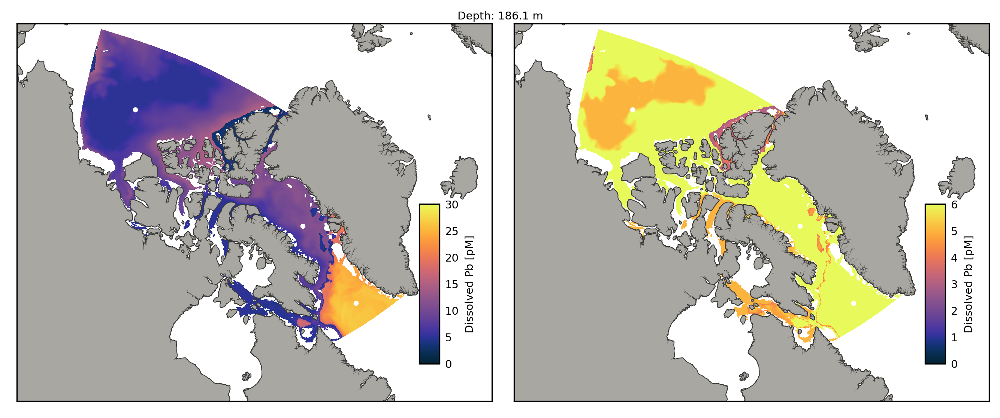

In [194]:
plot_layer(overall_IC, 25, vm1=(0,30), vm2=(0,6))

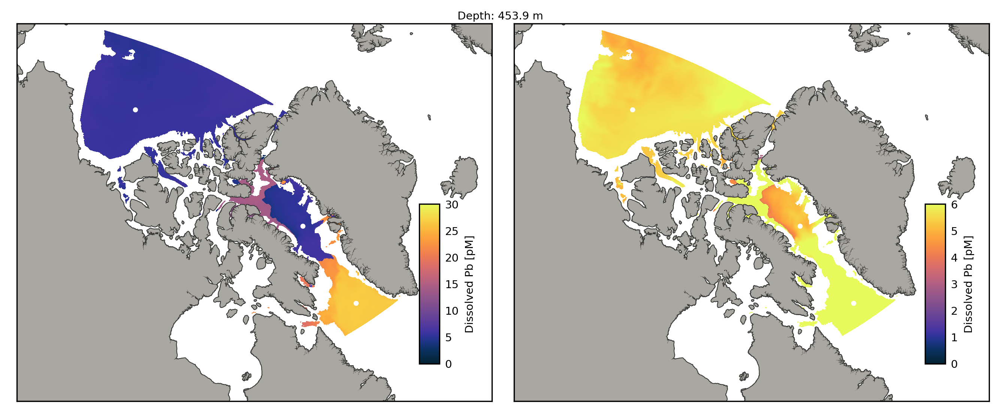

In [195]:
plot_layer(overall_IC, 30, vm1=(0,30), vm2=(0,6)) 

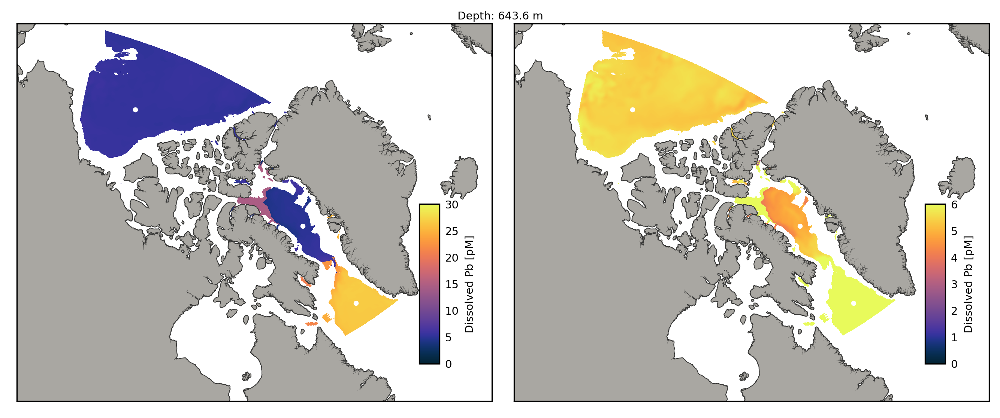

In [196]:
plot_layer(overall_IC, 32, vm1=(0,30), vm2=(0,6))

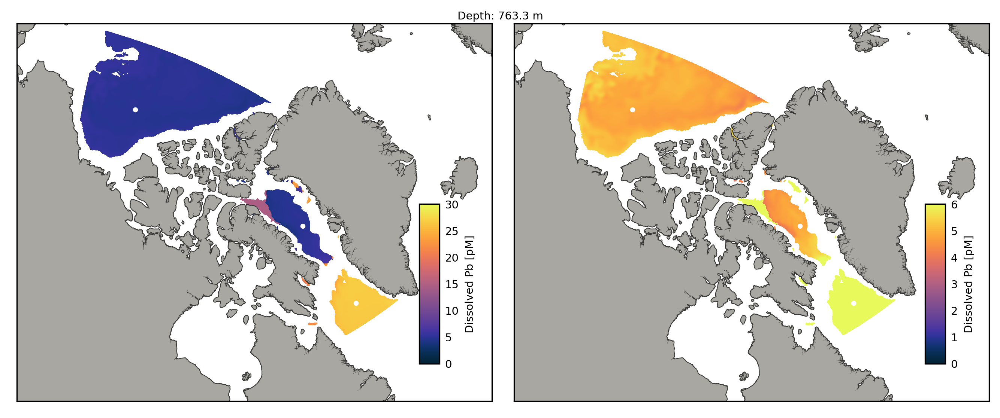

In [197]:
plot_layer(overall_IC, 33, vm1=(0,30), vm2=(0,6))

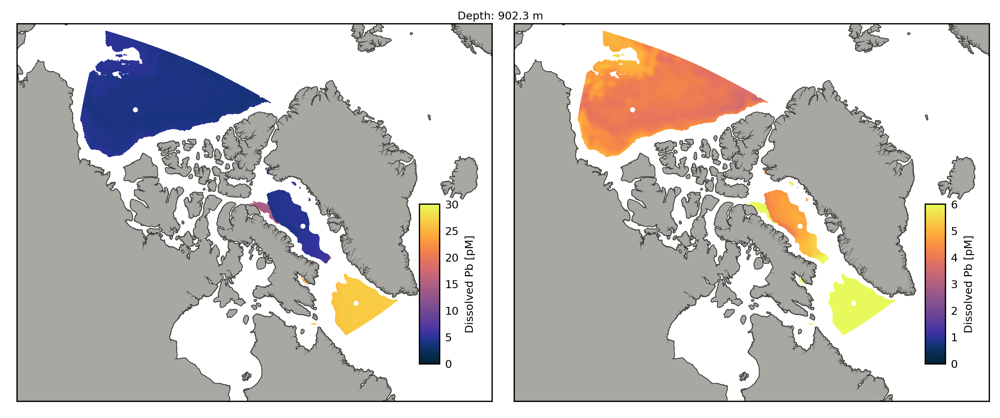

In [198]:
plot_layer(overall_IC, 34, vm1=(0,30), vm2=(0,6))

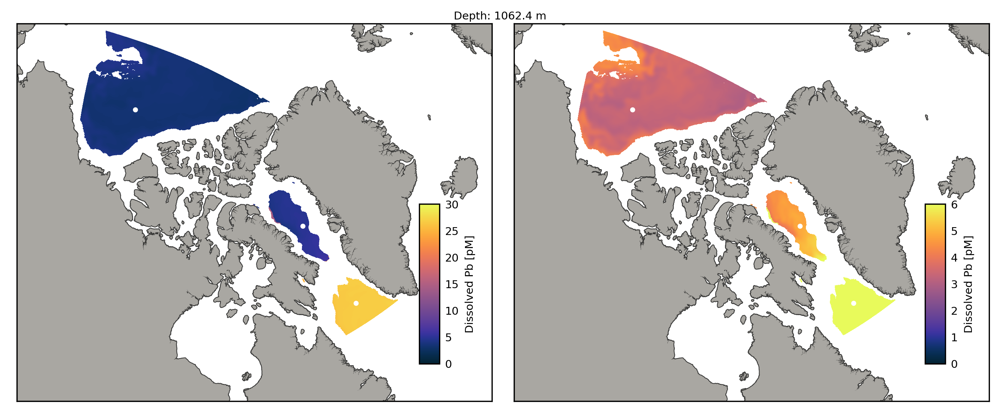

In [199]:
plot_layer(overall_IC, 35, vm1=(0,30), vm2=(0,6))

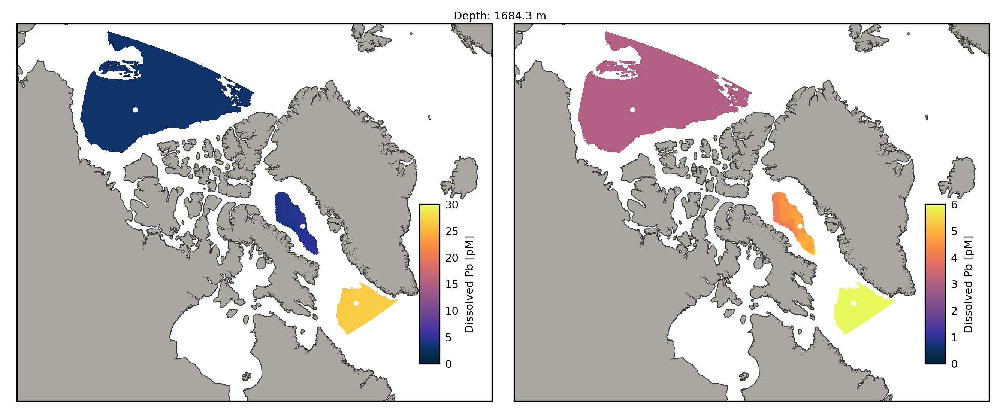

In [200]:
plot_layer(overall_IC, 38, vm1=(0,30), vm2=(0,6))

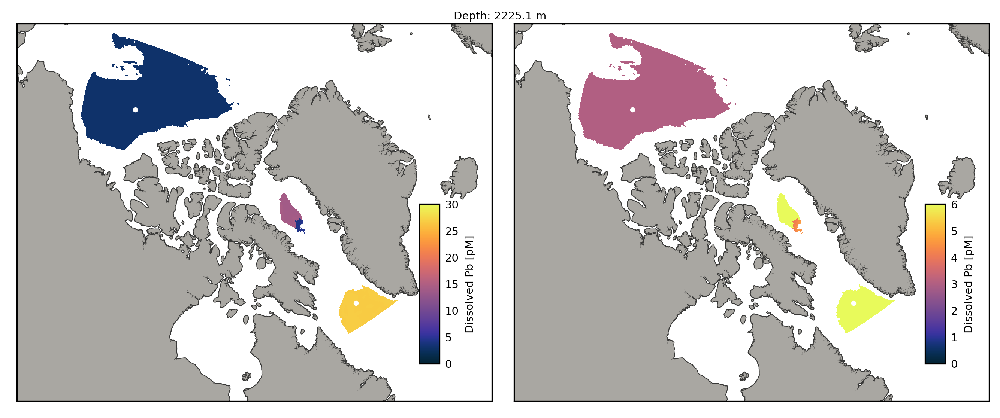

In [201]:
plot_layer(overall_IC, 40, vm1=(0,30), vm2=(0,6))

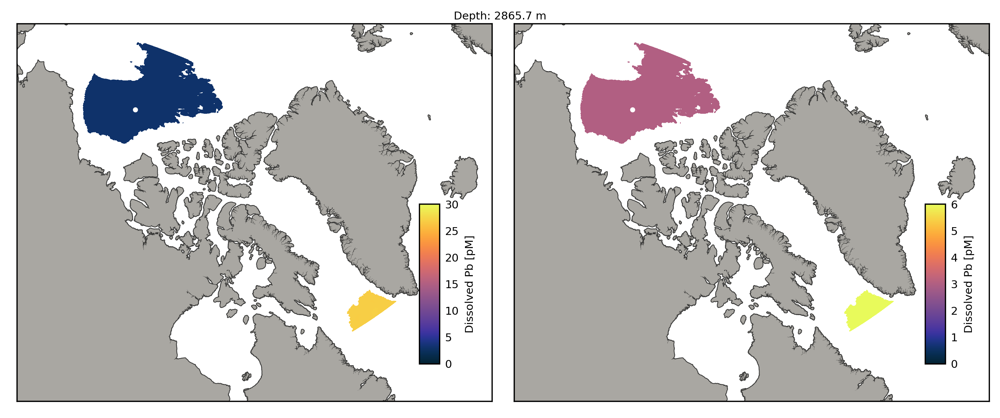

In [202]:
plot_layer(overall_IC, 42, vm1=(0,30), vm2=(0,6))

# Other

In [22]:
AO_based_IC = create_AO_BC(temp, sal)

In [23]:
LS_based_IC = create_LS_BC(temp, sal)

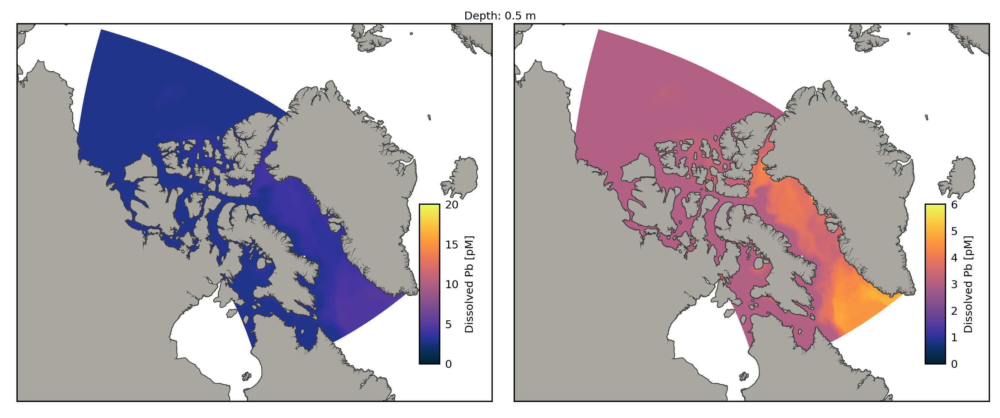

In [25]:
plot_layer(AO_based_IC, 0, vm1=(0,20), vm2=(0,6))

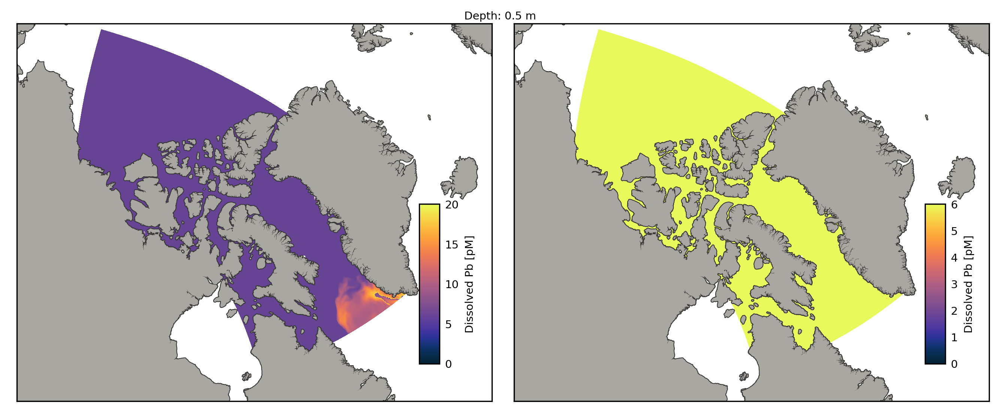

In [26]:
plot_layer(LS_based_IC, 0, vm1=(0,20), vm2=(0,6))

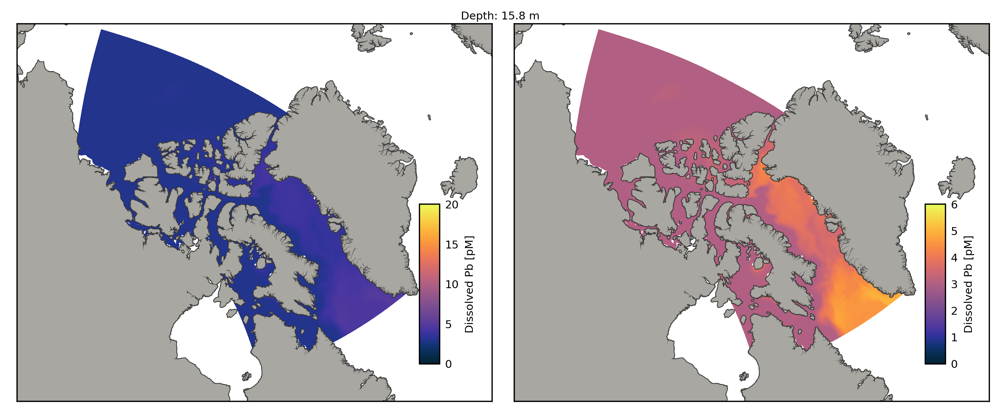

In [27]:
plot_layer(AO_based_IC, 10, vm1=(0,20), vm2=(0,6))

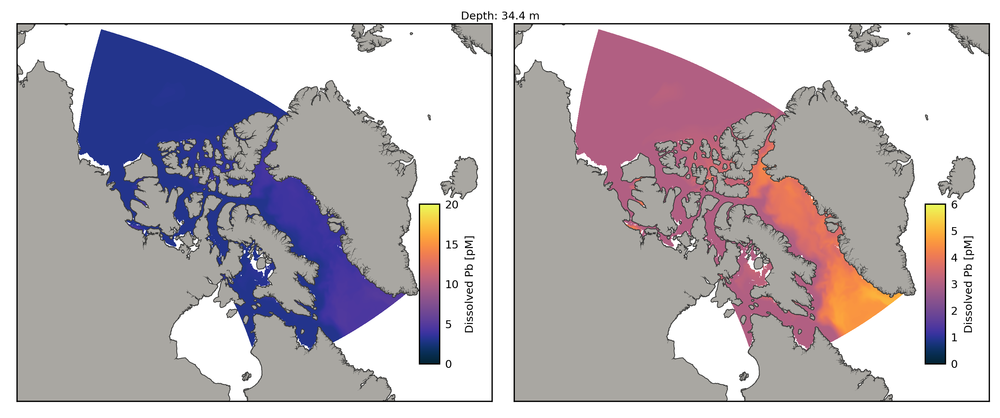

In [28]:
plot_layer(AO_based_IC, 15, vm1=(0,20), vm2=(0,6))

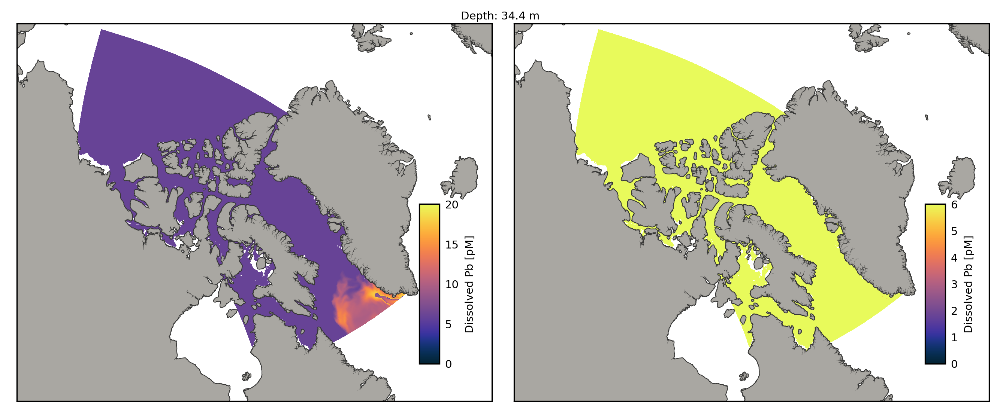

In [29]:
plot_layer(LS_based_IC, 15, vm1=(0,20), vm2=(0,6))

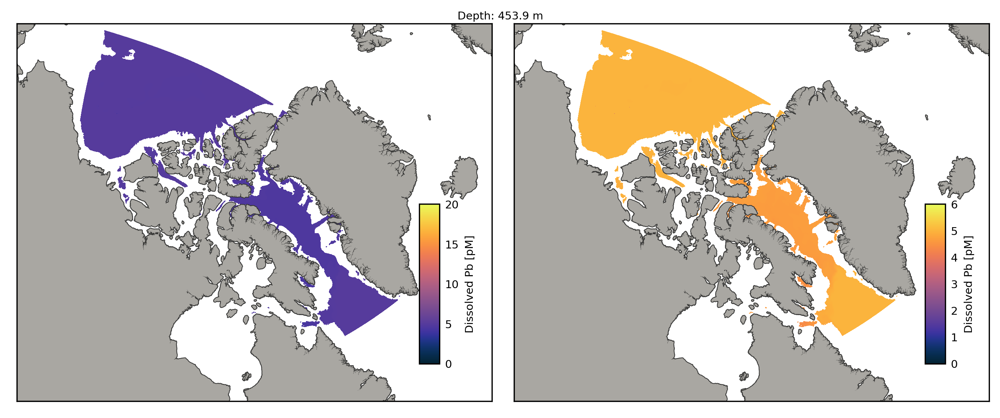

In [30]:
plot_layer(AO_based_IC, 30, vm1=(0,20), vm2=(0,6))

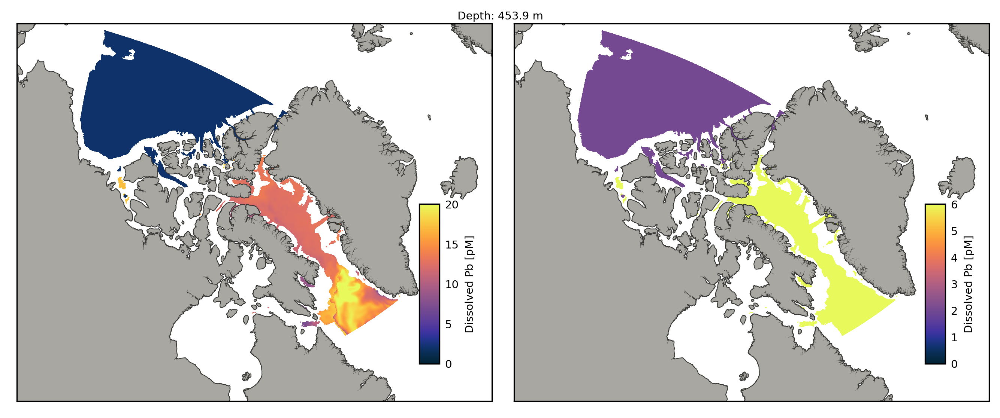

In [31]:
plot_layer(LS_based_IC, 30, vm1=(0,20), vm2=(0,6))

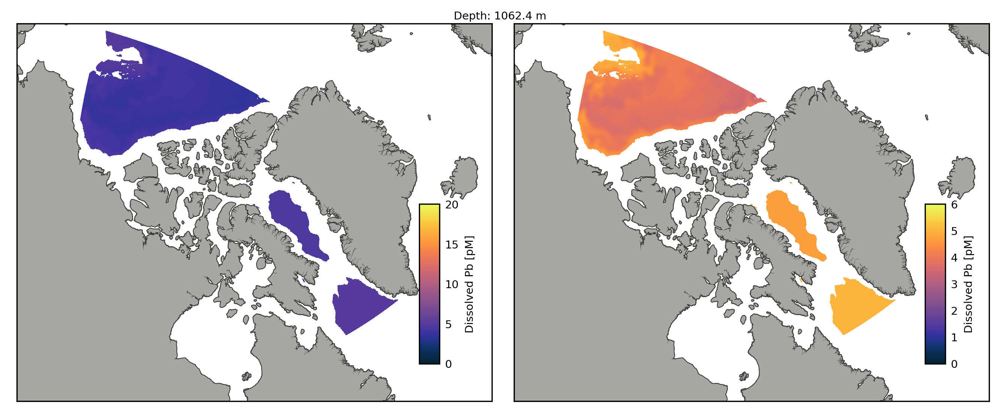

In [32]:
plot_layer(AO_based_IC, 35, vm1=(0,20), vm2=(0,6))

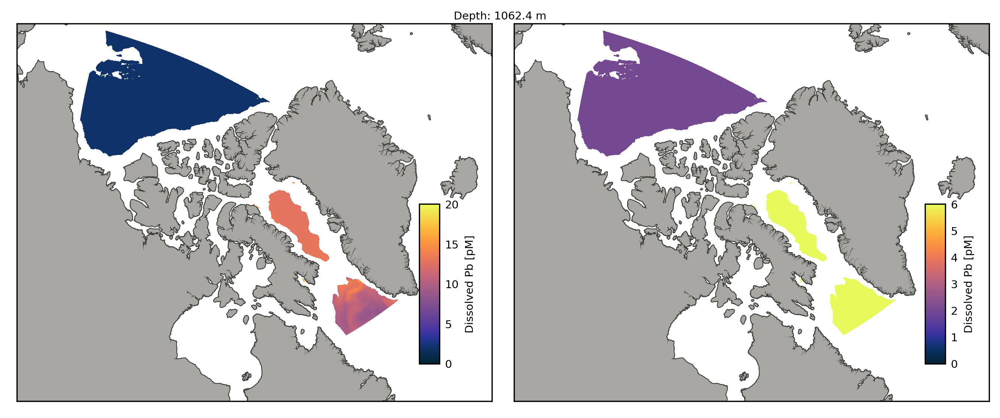

In [33]:
plot_layer(LS_based_IC, 35, vm1=(0,20), vm2=(0,6))

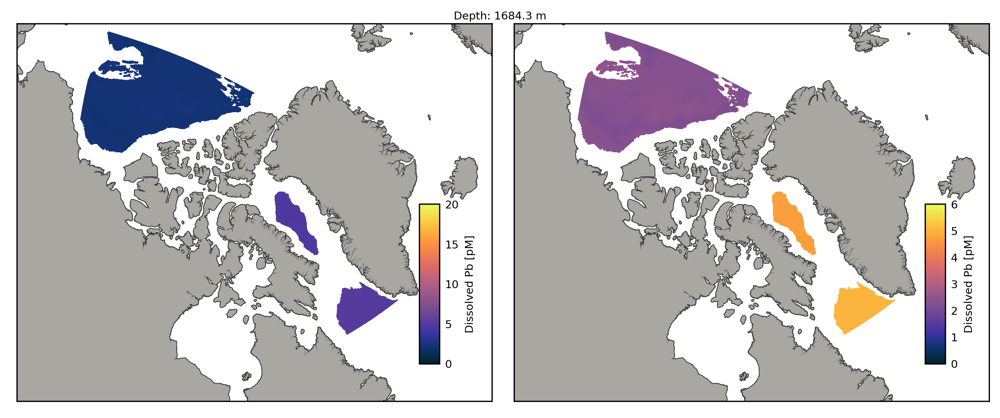

In [34]:
plot_layer(AO_based_IC, 38, vm1=(0,20), vm2=(0,6))

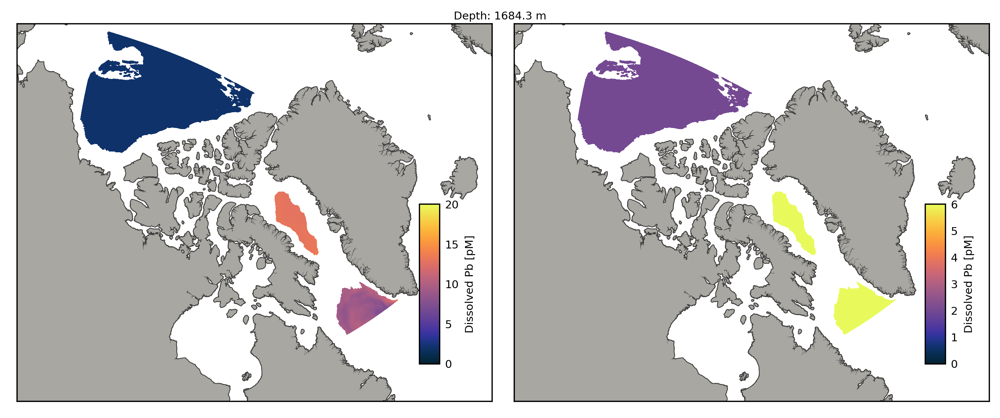

In [35]:
plot_layer(LS_based_IC, 38, vm1=(0,20), vm2=(0,6))